In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [ ]:
df = pd.read_csv('../data/data_fraud.csv') 

In [15]:
df = pd.get_dummies(df, columns=['marital_status', 'education_level'], drop_first=True)

In [16]:
df.head()

,application_id,application_date,loan_amount,annual_income,employment_years,job_stability_score,credit_score,credit_utilization,payment_history_score,open_credit_lines,...,age,residential_stability,loan_status,marital_status_Married,marital_status_Single,marital_status_Widowed,education_level_Bachelors,education_level_Doctorate,education_level_High School,education_level_Masters
0,APP_2328,2022-01-01,132221.82,60451.82,6.6,0.898,679,0.106,0.876,1,...,41,3.5,0,True,False,False,False,False,True,False
1,APP_558,2022-01-01,134906.42,114634.08,10.3,0.808,718,0.030,0.719,4,...,46,11.4,0,False,False,False,False,False,False,True
2,APP_2477,2022-01-01,30285.19,82772.53,12.1,0.964,768,0.174,0.775,6,...,44,8.6,0,False,False,True,False,False,True,False
3,APP_741,2022-01-01,32516.09,94023.36,9.1,0.690,670,0.141,0.993,3,...,26,3.9,0,False,True,False,True,False,False,False
4,APP_145,2022-01-02,77900.99,53515.02,7.2,0.679,651,0.097,0.946,2,...,50,9.6,0,False,True,False,False,False,False,False


In [17]:
print("Valores faltantes por variable:")
print(df.isnull().sum())


Valores faltantes por variable:
application_id                 0
application_date               0
loan_amount                    0
annual_income                  0
employment_years               0
job_stability_score            0
credit_score                   0
credit_utilization             0
payment_history_score          0
open_credit_lines              0
debt_to_income_ratio           0
savings_ratio                  0
asset_value                    0
age                            0
residential_stability          0
loan_status                    0
marital_status_Married         0
marital_status_Single          0
marital_status_Widowed         0
education_level_Bachelors      0
education_level_Doctorate      0
education_level_High School    0
education_level_Masters        0
dtype: int64


In [18]:
df.describe()

,loan_amount,annual_income,employment_years,job_stability_score,credit_score,credit_utilization,payment_history_score,open_credit_lines,debt_to_income_ratio,savings_ratio,asset_value,age,residential_stability,loan_status
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000
mean,155716.305344,67707.807596,6.675640,0.634643,681.728400,0.358176,0.740733,3.451600,0.408094,0.320784,175666.741236,42.045600,6.023200,0.265600
std,149605.357952,27302.931731,3.488021,0.293276,88.683309,0.289995,0.285966,2.083793,0.224736,0.192079,182652.568930,12.092395,3.205397,0.441741
min,5000.000000,15000.000000,0.000000,0.011000,334.000000,0.004000,0.029000,0.000000,0.009000,0.000000,550.630000,18.000000,0.000000,0.000000
25%,42984.517500,47475.317500,4.000000,0.375500,642.750000,0.131000,0.517500,2.000000,0.228000,0.161000,49513.082500,34.000000,3.600000,0.000000
50%,97054.315000,66963.475000,6.700000,0.752000,700.000000,0.246000,0.880500,3.000000,0.359000,0.327000,121018.750000,42.000000,5.900000,0.000000
75%,213214.992500,87347.642500,9.300000,0.866000,743.000000,0.592250,0.956000,5.000000,0.565000,0.464000,235513.902500,50.000000,8.400000,1.000000
max,500000.000000,149929.960000,19.300000,0.999000,850.000000,0.998000,1.000000,11.000000,0.979000,0.893000,1000000.000000,75.000000,16.400000,1.000000


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   application_id               2500 non-null   object 
 1   application_date             2500 non-null   object 
 2   loan_amount                  2500 non-null   float64
 3   annual_income                2500 non-null   float64
 4   employment_years             2500 non-null   float64
 5   job_stability_score          2500 non-null   float64
 6   credit_score                 2500 non-null   int64  
 7   credit_utilization           2500 non-null   float64
 8   payment_history_score        2500 non-null   float64
 9   open_credit_lines            2500 non-null   int64  
 10  debt_to_income_ratio         2500 non-null   float64
 11  savings_ratio                2500 non-null   float64
 12  asset_value                  2500 non-null   float64
 13  age               

In [20]:
ratio = df.shape[0] / df.shape[1]
print(f"Ratio de muestras por variable: {ratio:.1f}")

Ratio de muestras por variable: 108.7


## Summary

We have a database containing 23 variables with no missing values. The dataset includes 2,500 entries, resulting in a variable-to-observation ratio of approximately 1:109, which makes it suitable for the analysis.

## EDA

In [21]:
defaulter = df[df['loan_status'] == 1]
non_defaulter = df[df['loan_status'] == 0]

In [22]:
print("Número de defaulters:", len(defaulter))
print("Número de non-defaulters:", len(non_defaulter))
print("Default Rate: {:.2f}%".format((len(defaulter) / len(df)) * 100))

Número de defaulters: 664
Número de non-defaulters: 1836
Default Rate: 26.56%


In [23]:
num_features = df.select_dtypes(include=[np.number]).columns.tolist()

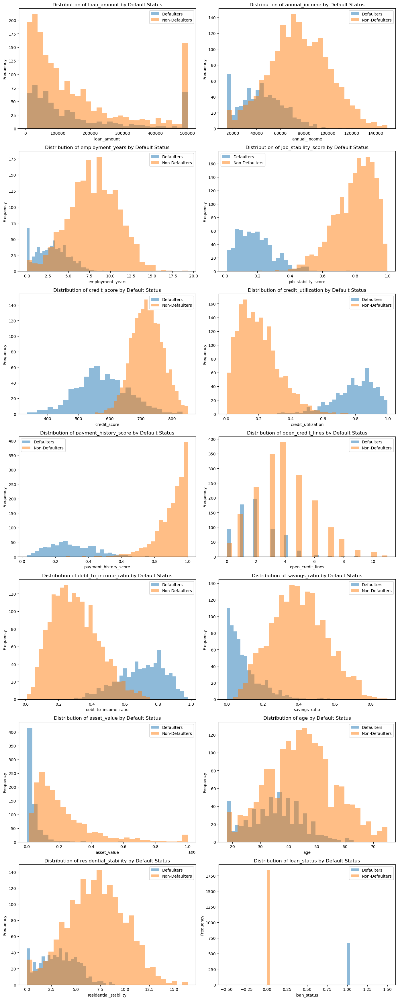

In [24]:
n_features = len(num_features)
# 1. Define number of columns and calculate rows
ncols = 2
nrows = math.ceil(n_features / 2)

# 2. Create subplots with the new layout (e.g., 14 wide for 2 plots)
fig, axes = plt.subplots(nrows, ncols, figsize=(14, nrows * 5))

# 3. Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# 4. Loop through features and the flattened axes
for ax, i in zip(axes_flat, num_features):
    ax.hist(defaulter[i], bins=30, alpha=0.5, label='Defaulters')
    ax.hist(non_defaulter[i], bins=30, alpha=0.5, label='Non-Defaulters')
    
    ax.set_xlabel(i)
    ax.set_ylabel('Frequency')
    ax.set_title(f'Distribution of {i} by Default Status')
    ax.legend()

# 5. Hide any unused subplots (if n_features is odd)
for j in range(n_features, len(axes_flat)):
    axes_flat[j].set_visible(False)

plt.tight_layout()
plt.show()

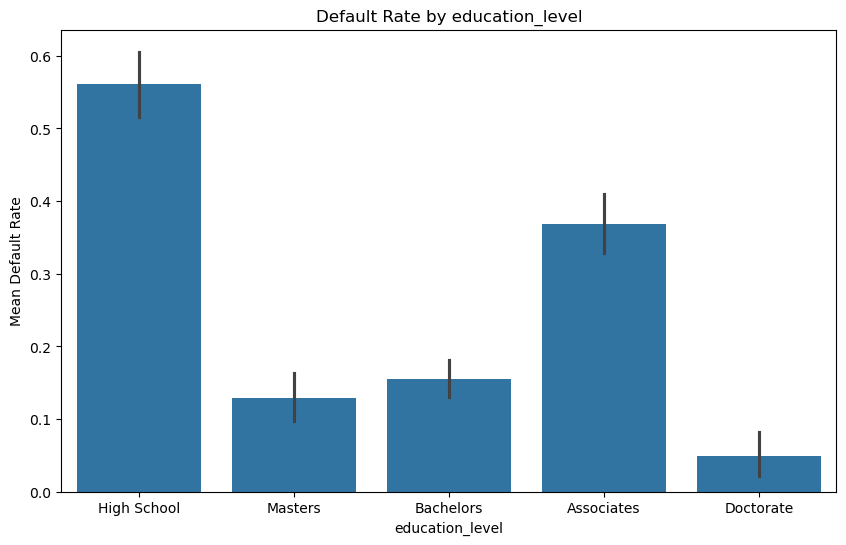

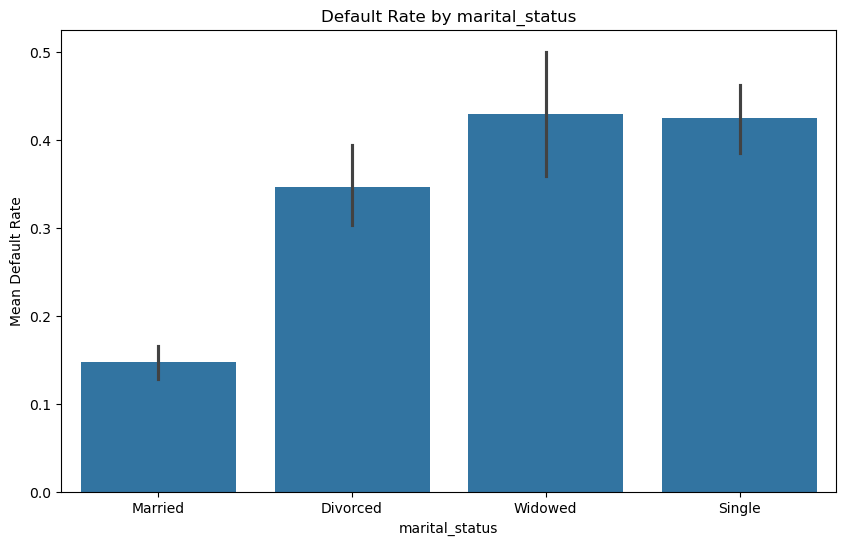

In [ ]:
df_cat = pd.read_csv('../data/data_fraud.csv') 
categorical_vars = ['education_level', 'marital_status']

for var in categorical_vars:
    plt.figure(figsize=(10, 6))
    sns.barplot(x=var, y='loan_status', data=df_cat, estimator=lambda x: sum(x) / len(x))
    plt.title(f"Default Rate by {var}")
    plt.xlabel(var)
    plt.ylabel("Mean Default Rate")
    plt.show()

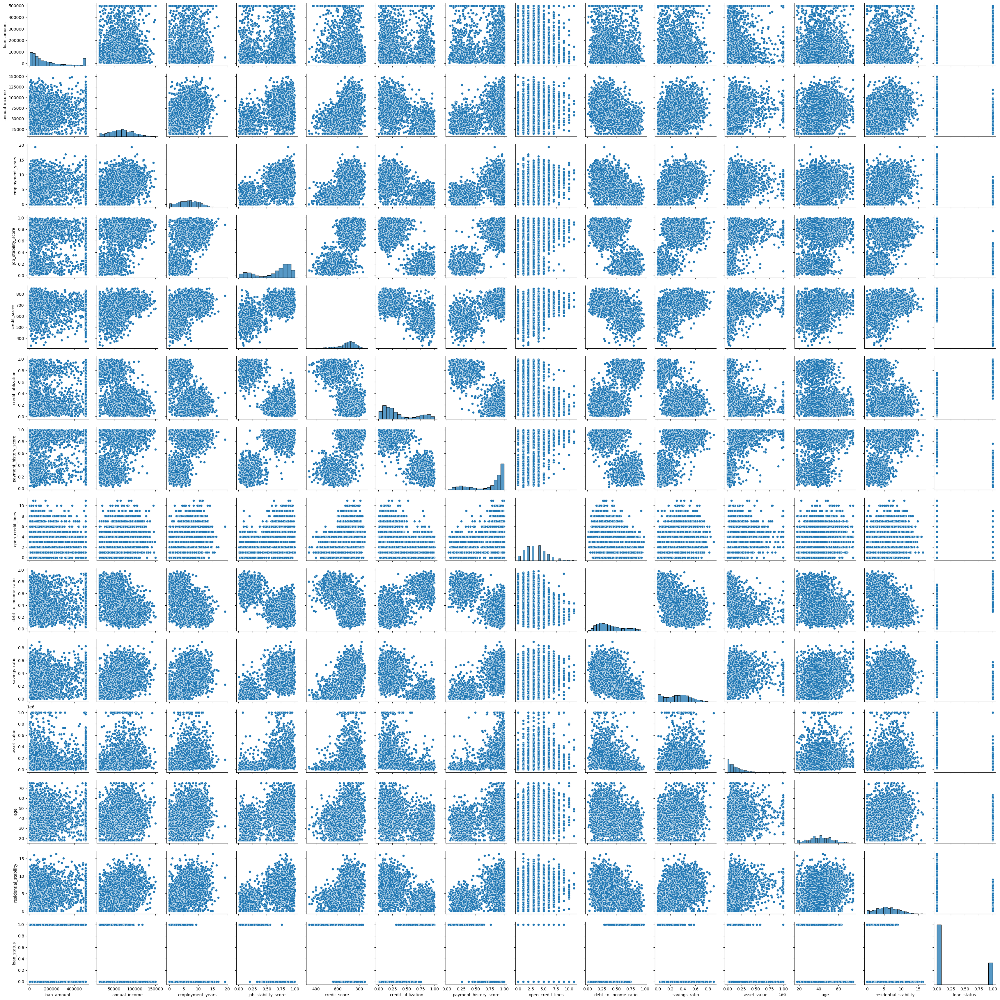

In [27]:
sns.pairplot(df_cat.drop(columns=['application_date','application_id']))
plt.show()

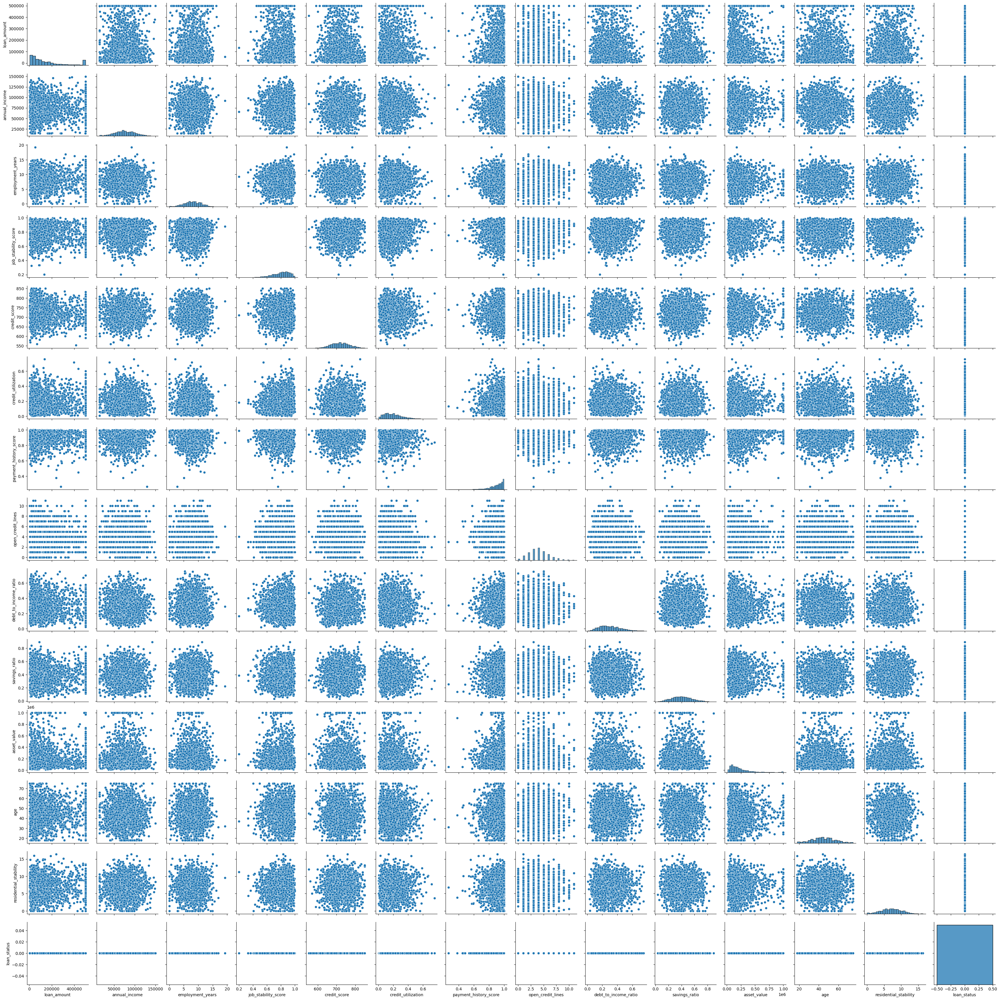

In [28]:
cat_non_defaulter = df_cat[df_cat['loan_status'] == 0]
sns.pairplot(cat_non_defaulter.drop(columns=['application_date','application_id']))
plt.show()

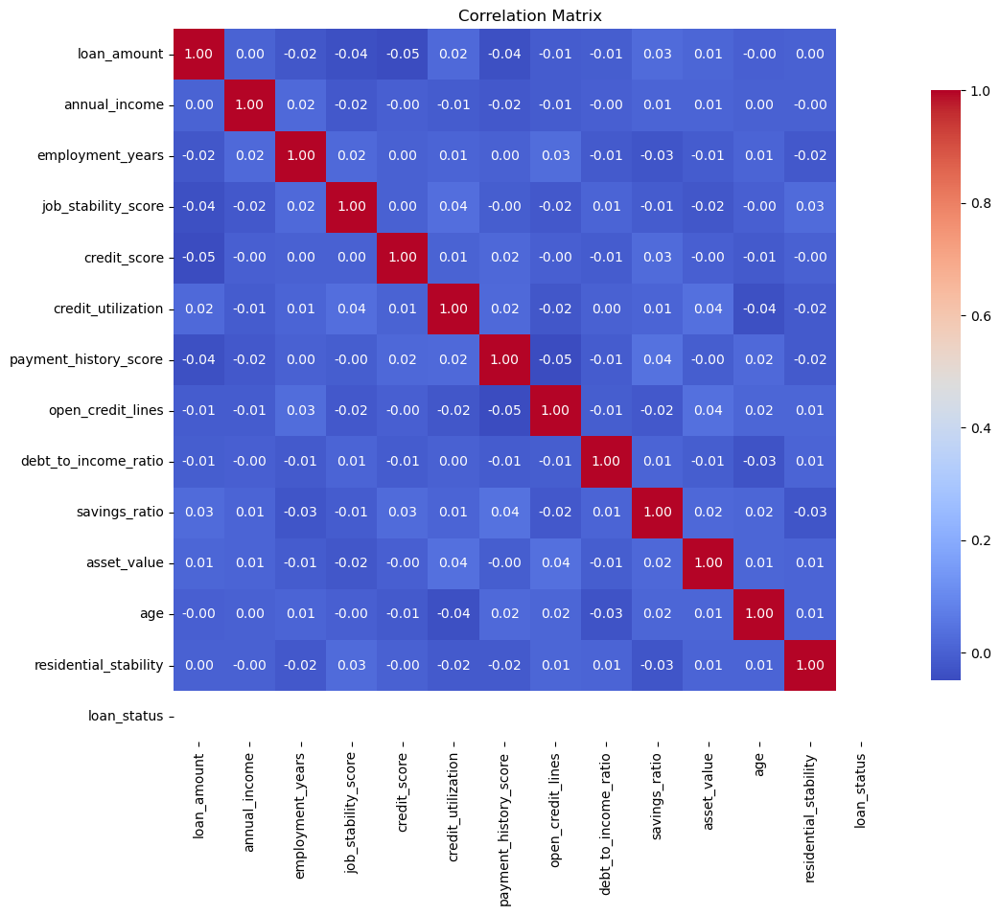

In [29]:
corr_matrix = cat_non_defaulter.drop(columns=['application_date','application_id', 'education_level', 'marital_status']).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix')
plt.show()

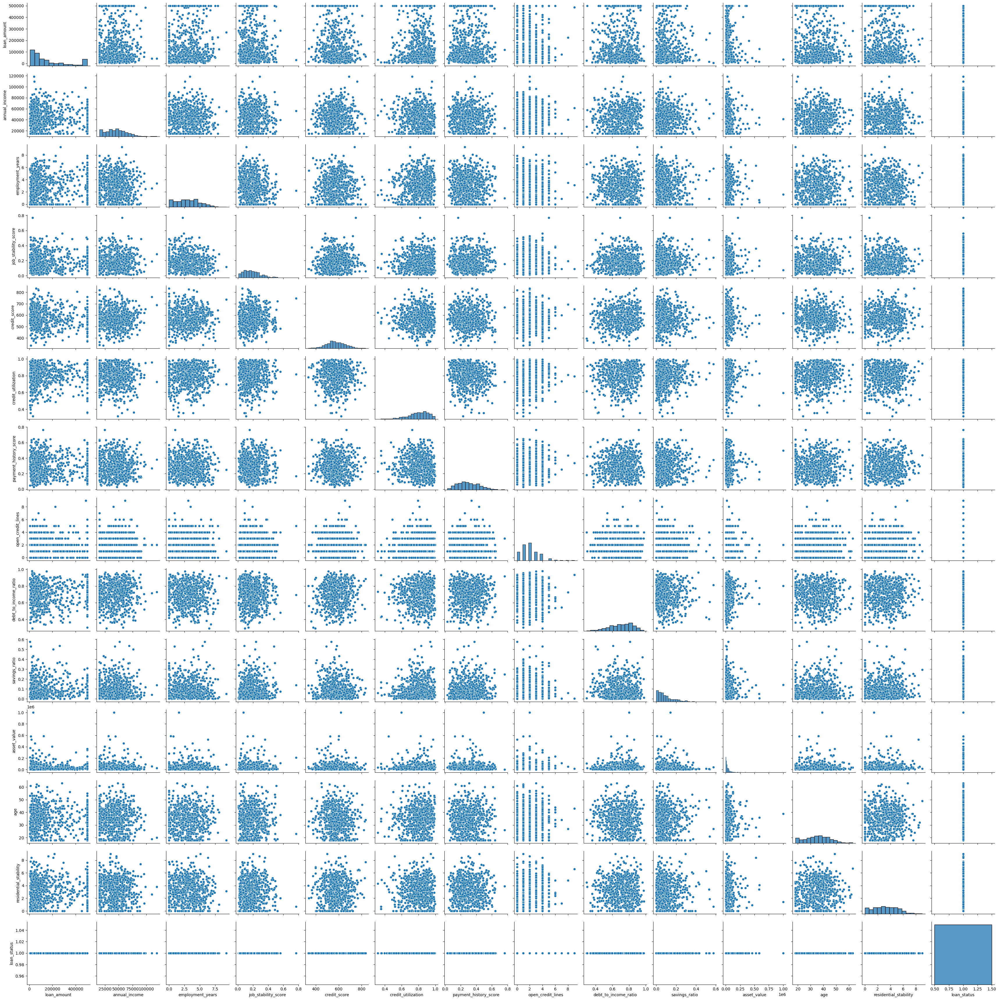

In [30]:
cat_defaulter = df_cat[df_cat['loan_status'] == 1]
sns.pairplot(cat_defaulter.drop(columns=['application_date','application_id']))
plt.show()

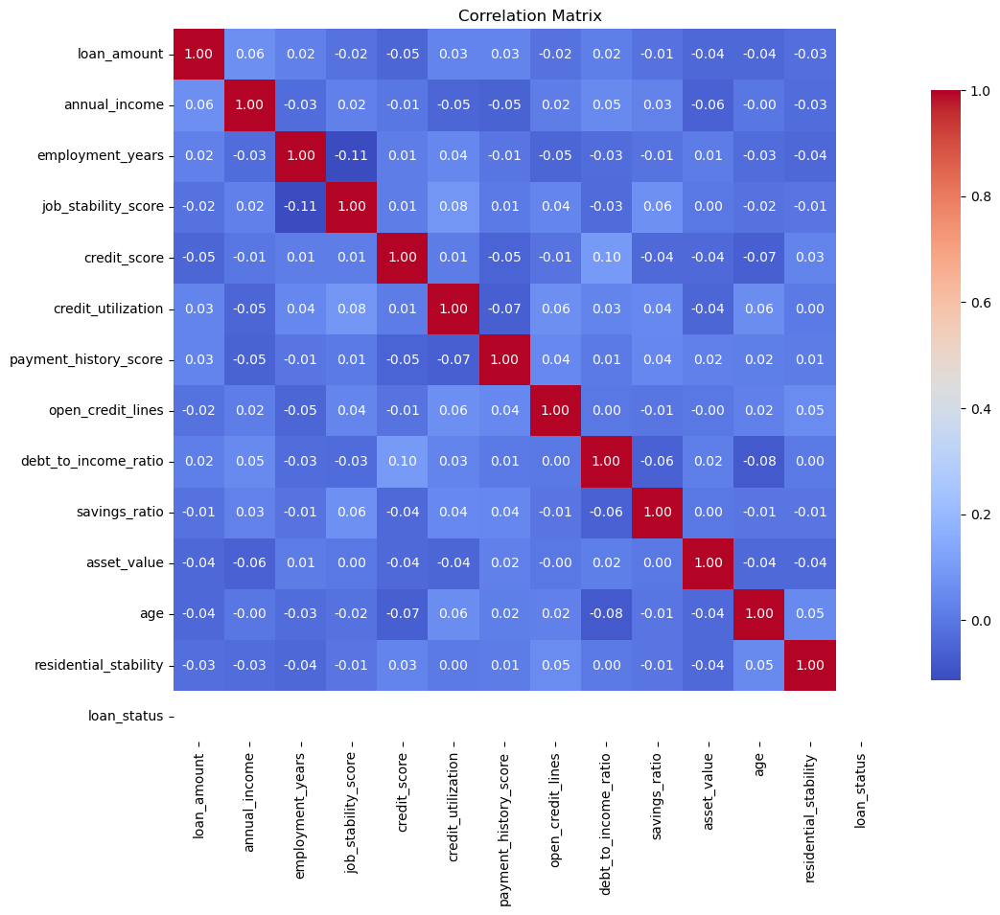

In [31]:
corr_matrix = cat_defaulter.drop(columns=['application_date','application_id', 'education_level', 'marital_status']).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix')
plt.show()

## Data Preprocessing

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [33]:
X = df.drop(columns=['application_id','loan_status'], axis=1)
y = df['loan_status'].values

In [34]:
testing_population = df.query('application_date >= "2024-06-01"')
training_population = df.query('application_date < "2024-06-01"')


In [35]:
len(testing_population.query('loan_status == 1'))/(len(testing_population.query('loan_status == 1')) + len(testing_population.query('loan_status == 0')))

0.26003824091778205

In [36]:
X = training_population.drop(columns=['application_id','loan_status','application_date'], axis=1)
y = training_population['loan_status'].values

X_test = testing_population.drop(columns=['application_id','loan_status','application_date'], axis=1)
y_test = testing_population['loan_status'].values

X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [37]:
standarscaler = StandardScaler()
X_train_scaled = standarscaler.fit_transform(X_train)
X_validate_scaled = standarscaler.transform(X_validate)
X_test_scaled = standarscaler.transform(X_test)

## Statistical Assumption Tesing

Both Linear Discriminant Analysis (LDA) and Quadratic Discriminant Analysis (QDA) assume that the predictor variables are normally distributed within each class.
This means that for every group or category, the data points should approximately follow a multivariate normal distribution.

To reinforce this assumption, the historograms presented clearly show that the data is normally distributed for numeric variables. Our team decided to assume that all classes share a common covariance structure since in the pairplot we can identify similar point clouds that suggest homogeneity of covariances. If this assumption is True, LDA is expected to perform better than the QDA.

## LDA

In [38]:
hyperparameters = {
    'solver': ['svd', 'lsqr', 'eigen'],
    'shrinkage': [None, 'auto'],
    'tol': [1e-4, 1e-3, 1e-2],
    'store_covariance': [True, False],
}

In [39]:
def CV_LDA(X_train, y_train, X_validate, y_validate, hyperparameters):
    best_score = 0
    best_params = {}
    
    for solver in hyperparameters['solver']:
        for shrinkage in hyperparameters['shrinkage']:
            for tol in hyperparameters['tol']:
                for store_covariance in hyperparameters['store_covariance']:
                    if solver == 'svd' and shrinkage is not None:
                        continue  

                    lda = LinearDiscriminantAnalysis(solver=solver, shrinkage=shrinkage, tol=tol, store_covariance=store_covariance)
                    lda.fit(X_train, y_train)
                    score = lda.score(X_validate, y_validate)
                    
                    if score > best_score:
                        best_score = score
                        best_params = {'solver': solver, 'shrinkage': shrinkage, 'tol': tol, 'store_covariance': store_covariance}
                        best_lda = lda
    
    return best_params, best_score, best_lda

In [40]:
LDA_best_params, LDA_best_score, LDA_best_lda = CV_LDA(X_train_scaled, y_train, X_validate_scaled, y_validate, hyperparameters)

In [41]:
lda_coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': LDA_best_lda.coef_[0]
})
lda_coefficients = lda_coefficients.reindex(lda_coefficients['Coefficient'].abs().sort_values(ascending=False).index)
print(lda_coefficients)

                        Feature  Coefficient
6         payment_history_score   -15.672012
3           job_stability_score   -12.800572
5            credit_utilization    11.317957
8          debt_to_income_ratio     4.554815
4                  credit_score    -4.238531
2              employment_years    -2.873156
9                 savings_ratio    -2.681301
12        residential_stability    -1.751812
1                 annual_income    -1.659910
7             open_credit_lines    -1.462896
18  education_level_High School     1.137332
10                  asset_value    -1.070954
0                   loan_amount    -0.745283
11                          age    -0.495603
14        marital_status_Single     0.480114
15       marital_status_Widowed     0.354983
16    education_level_Bachelors    -0.157395
19      education_level_Masters    -0.071111
13       marital_status_Married    -0.037813
17    education_level_Doctorate     0.017360


Negative Coefficients (Lower Risk)
A negative sign means that as the feature's value increases, the final risk score decreases. These are your "good" features; they actively lower the predicted probability of default.

- payment_history_score (-15.67): A better payment history strongly decreases the predicted risk.

- job_stability_score (-12.80): Higher job stability strongly decreases the predicted risk.

- credit_score (-4.24): A higher credit score moderately decreases the predicted risk.

Positive Coefficients (Higher Risk)
A positive sign means that as the feature's value increases, the final risk score increases. These are your "bad" features; they raise the predicted probability of default.

- credit_utilization (11.32): Higher credit usage strongly increases the predicted risk.

- debt_to_income_ratio (4.55): A higher DTI moderately increases the predicted risk.



## QDA

In [42]:
hyperparameters_qda = {
    'reg_param': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'tol': [1e-4, 1e-3, 1e-2],
    'store_covariance': [True, False],
}

In [43]:
def CV_QDA(X_train, y_train, X_validate, y_validate, hyperparameters):
    best_score = 0
    best_params = {}
    
    for reg_param in hyperparameters['reg_param']:
        for tol in hyperparameters['tol']:
            for store_covariance in hyperparameters['store_covariance']:
                qda = QuadraticDiscriminantAnalysis(reg_param=reg_param, tol=tol, store_covariance=store_covariance)
                qda.fit(X_train, y_train)
                score = qda.score(X_validate, y_validate)
                
                if score > best_score:
                    best_score = score
                    best_params = {'reg_param': reg_param, 'tol': tol, 'store_covariance': store_covariance}
                    best_qda = qda

    return best_params, best_score, best_qda

In [44]:
QDA_best_params, QDA_best_score, QDA_best_lda = CV_QDA(X_train_scaled, y_train, X_validate_scaled, y_validate, hyperparameters_qda)

## Model Evaluation

In [45]:
print("Best Hyperparameters:", QDA_best_params)
print("Best Validation Score:", QDA_best_score)

Best Hyperparameters: {'reg_param': 0.0, 'tol': 0.0001, 'store_covariance': True}
Best Validation Score: 1.0


In [46]:
y_pred_QDA = QDA_best_lda.predict(X_test_scaled)
print(confusion_matrix(y_test, y_pred_QDA))
print(classification_report(y_test, y_pred_QDA))

[[387   0]
 [  0 136]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       387
           1       1.00      1.00      1.00       136

    accuracy                           1.00       523
   macro avg       1.00      1.00      1.00       523
weighted avg       1.00      1.00      1.00       523



In [47]:
print("Best Hyperparameters:", LDA_best_params)
print("Best Validation Score:", LDA_best_score)

Best Hyperparameters: {'solver': 'svd', 'shrinkage': None, 'tol': 0.0001, 'store_covariance': True}
Best Validation Score: 1.0


In [48]:
y_pred_LDA = LDA_best_lda.predict(X_test_scaled)
print(confusion_matrix(y_test, y_pred_LDA))
print(classification_report(y_test, y_pred_LDA))

[[387   0]
 [  0 136]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       387
           1       1.00      1.00      1.00       136

    accuracy                           1.00       523
   macro avg       1.00      1.00      1.00       523
weighted avg       1.00      1.00      1.00       523



In [49]:
print("LDA: ", classification_report(y_test, y_pred_LDA, output_dict=True)['1'])

LDA:  {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 136.0}


In [50]:
print('QDA: ', classification_report(y_test, y_pred_QDA, output_dict=True)['1'])

QDA:  {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 136.0}


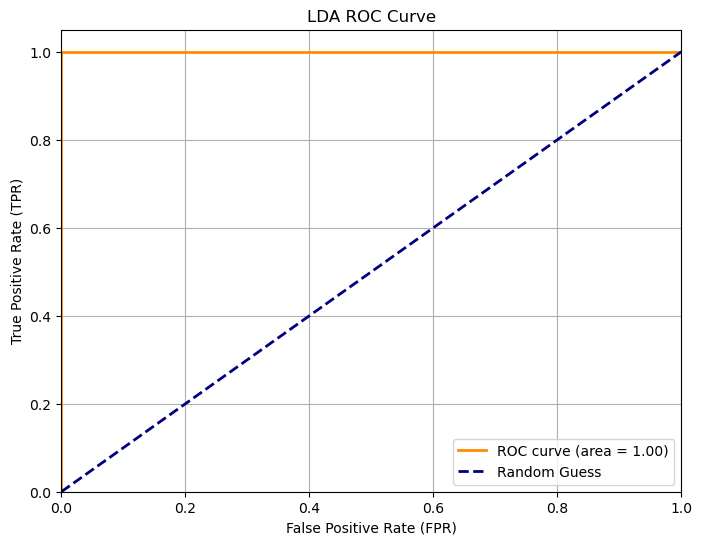

In [51]:
from sklearn.metrics import roc_curve, auc
y_probs = LDA_best_lda.predict_proba(X_test_scaled)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_probs)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (area = {roc_auc:0.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', 
         label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('LDA ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

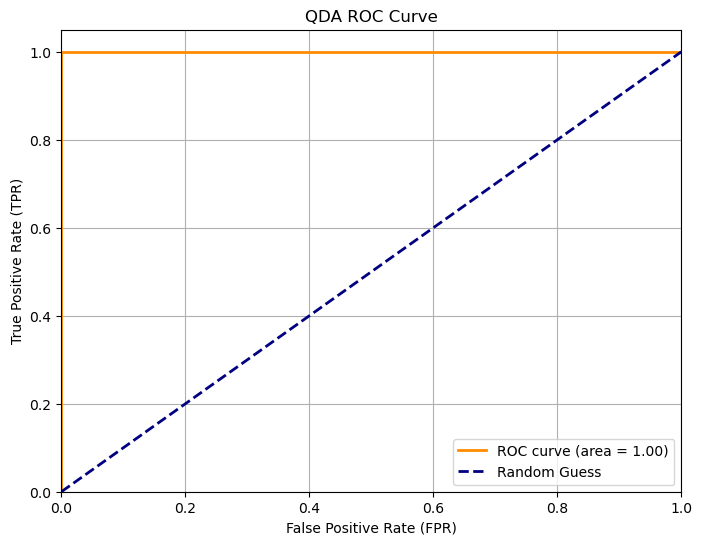

In [52]:
from sklearn.metrics import roc_curve, auc
y_probs = QDA_best_lda.predict_proba(X_test_scaled)[:, 1]


fpr, tpr, thresholds = roc_curve(y_test, y_probs)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (area = {roc_auc:0.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', 
         label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('QDA ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

## Technical Conclusion  

The results obtained were outstanding for both models: LDA and QDA achieved perfect classification, as evidenced by both their confusion matrices and performance metrics, where no false positives or false negatives were observed. These results confirm that the discriminant methods applied were highly effective in distinguishing between default and non-default individuals within the analyzed dataset.

However, despite identical performance in terms of accuracy, interpretability was a decisive factor in choosing the LDA model. Its linear structure allows for a better understanding of the contribution of each variable and more accurate recommendations for the company, while the QDA model, although equally effective, lacks easily interpretable coefficients due to its quadratic nature.

## Team Information
**Members:**
- [César Isao Pastelin Kohagura] ([A01659947]) 
- [Eduardo Botello Casey] ([A01659281]) 
- [Luis Emilio Fernández González] ([A01659517]) 
**Deliverable Links:**
- **Presentation Video:** [YouTube Link]
- **Executive Summary:** [Available on Canvas]
- **Dataset:** `credit_risk_data.csv`
**Completion Date:** [07/11/2025]

In [53]:
import os

# Create visualizations directory if it doesn't exist
viz_dir = '../visualizations'
os.makedirs(viz_dir, exist_ok=True)

# 1. Distribution histograms
plt.savefig(f'{viz_dir}/distributions_by_default_status.png', dpi=300, bbox_inches='tight')
plt.close()

# 2. Default rate by education level
plt.savefig(f'{viz_dir}/default_rate_by_education.png', dpi=300, bbox_inches='tight')
plt.close()

# 3. Default rate by marital status
plt.savefig(f'{viz_dir}/default_rate_by_marital_status.png', dpi=300, bbox_inches='tight')
plt.close()

# 4. Pairplot all data
plt.savefig(f'{viz_dir}/pairplot_all_data.png', dpi=300, bbox_inches='tight')
plt.close()

# 5. Pairplot non-defaulters
plt.savefig(f'{viz_dir}/pairplot_non_defaulters.png', dpi=300, bbox_inches='tight')
plt.close()

# 6. Correlation matrix non-defaulters
plt.savefig(f'{viz_dir}/correlation_matrix_non_defaulters.png', dpi=300, bbox_inches='tight')
plt.close()

# 7. Pairplot defaulters
plt.savefig(f'{viz_dir}/pairplot_defaulters.png', dpi=300, bbox_inches='tight')
plt.close()

# 8. Correlation matrix defaulters
plt.savefig(f'{viz_dir}/correlation_matrix_defaulters.png', dpi=300, bbox_inches='tight')
plt.close()

# 9. LDA ROC Curve
plt.savefig(f'{viz_dir}/lda_roc_curve.png', dpi=300, bbox_inches='tight')
plt.close()

# 10. QDA ROC Curve
plt.savefig(f'{viz_dir}/qda_roc_curve.png', dpi=300, bbox_inches='tight')
plt.close()

print("All visualizations exported to PNG successfully!")

All visualizations exported to PNG successfully!
